<a href="https://colab.research.google.com/github/InduwaraGayashan001/TensorFlow/blob/main/Object_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

In [1]:
import os
import numpy as np
import cv2
import zipfile
import requests
import glob as glob

import tensorflow_hub as hub
import matplotlib
import matplotlib.pyplot as plt
import warnings
import logging
import absl

# Filter absl warnings
warnings.filterwarnings("ignore", module="absl")

# Capture all warnings in the logging system
logging.captureWarnings(True)

# Set the absl logger level to 'error' to suppress warnings
absl_logger = logging.getLogger("absl")
absl_logger.setLevel(logging.ERROR)

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

# Extract Images

In [2]:
def download_file(url, save_name):
    url = url
    file = requests.get(url)

    open(save_name, 'wb').write(file.content)
def unzip(zip_file=None):
    try:
        with zipfile.ZipFile(zip_file) as z:
            z.extractall("./")
            print("Extracted all")
    except:
        print("Invalid file")
download_file(
    'https://www.dropbox.com/s/h7l1lmhvga6miyo/object_detection_images.zip?dl=1',
    'object_detection_images.zip'
)

unzip(zip_file='object_detection_images.zip')

Extracted all


In [3]:
image_paths = sorted(glob.glob('object_detection_images' + '/*.png'))

for idx in range(len(image_paths)):
    print(image_paths[idx])

object_detection_images/dog_bicycle_car.png
object_detection_images/elephants.png
object_detection_images/home_interior.png
object_detection_images/place_setting.png


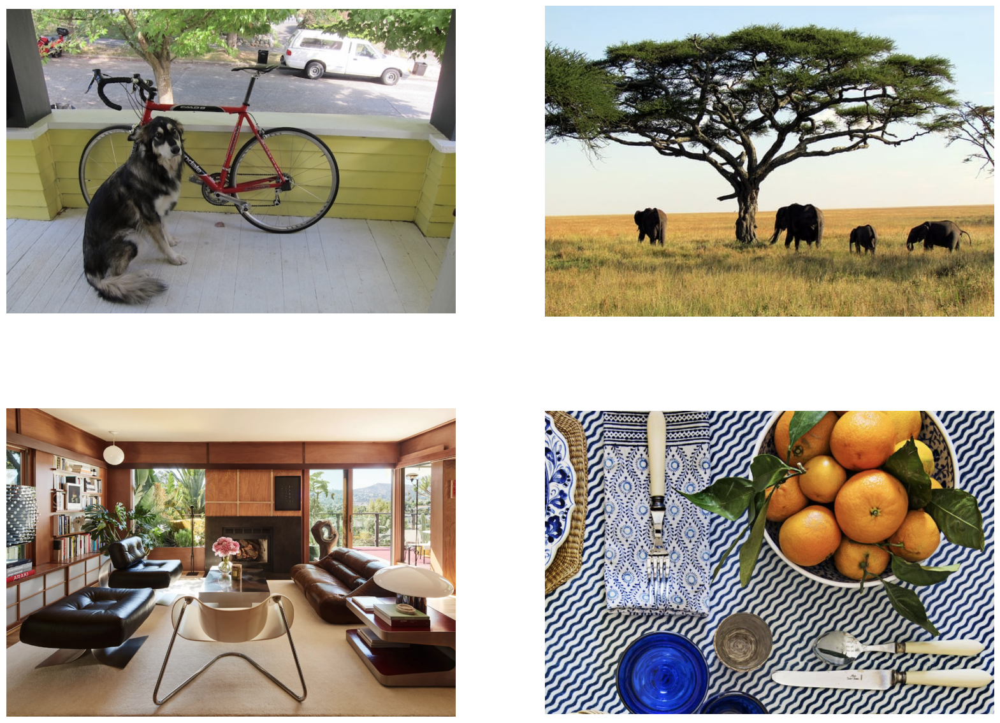

In [4]:
def load_image(path):

    image = cv2.imread(path)

    # Convert image in BGR format to RGB.
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Add a batch dimension which is required by the model.
    image = np.expand_dims(image, axis=0)

    return image
images = []
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20, 15))

idx=0
for axis in ax.flat:
    image = load_image(image_paths[idx])
    images.append(image)
    axis.imshow(image[0])
    axis.axis('off')
    idx+=1

In [5]:
class_index =  \
{
         1: 'person',
         2: 'bicycle',
         3: 'car',
         4: 'motorcycle',
         5: 'airplane',
         6: 'bus',
         7: 'train',
         8: 'truck',
         9: 'boat',
         10: 'traffic light',
         11: 'fire hydrant',
         13: 'stop sign',
         14: 'parking meter',
         15: 'bench',
         16: 'bird',
         17: 'cat',
         18: 'dog',
         19: 'horse',
         20: 'sheep',
         21: 'cow',
         22: 'elephant',
         23: 'bear',
         24: 'zebra',
         25: 'giraffe',
         27: 'backpack',
         28: 'umbrella',
         31: 'handbag',
         32: 'tie',
         33: 'suitcase',
         34: 'frisbee',
         35: 'skis',
         36: 'snowboard',
         37: 'sports ball',
         38: 'kite',
         39: 'baseball bat',
         40: 'baseball glove',
         41: 'skateboard',
         42: 'surfboard',
         43: 'tennis racket',
         44: 'bottle',
         46: 'wine glass',
         47: 'cup',
         48: 'fork',
         49: 'knife',
         50: 'spoon',
         51: 'bowl',
         52: 'banana',
         53: 'apple',
         54: 'sandwich',
         55: 'orange',
         56: 'broccoli',
         57: 'carrot',
         58: 'hot dog',
         59: 'pizza',
         60: 'donut',
         61: 'cake',
         62: 'chair',
         63: 'couch',
         64: 'potted plant',
         65: 'bed',
         67: 'dining table',
         70: 'toilet',
         72: 'tv',
         73: 'laptop',
         74: 'mouse',
         75: 'remote',
         76: 'keyboard',
         77: 'cell phone',
         78: 'microwave',
         79: 'oven',
         80: 'toaster',
         81: 'sink',
         82: 'refrigerator',
         84: 'book',
         85: 'clock',
         86: 'vase',
         87: 'scissors',
         88: 'teddy bear',
         89: 'hair drier',
         90: 'toothbrush'
}

In [6]:
R = np.array(np.arange(96, 256, 32))
G = np.roll(R, 1)
B = np.roll(R, 2)

COLOR_IDS = np.array(np.meshgrid(R, G, B)).T.reshape(-1, 3)

# Model Inference

In [7]:
model_url  = 'https://tfhub.dev/tensorflow/efficientdet/d4/1'
print(f"Loading Model : {model_url}")
od_model = hub.load(model_url)
print("Model Loaded")

Loading Model : https://tfhub.dev/tensorflow/efficientdet/d4/1
Model Loaded


In [8]:
results = od_model(images[0])

In [9]:
results =  {key:value.numpy() for key,value in results.items()}

In [10]:
for key, value in results.items():
    print(key, value.shape)

raw_detection_boxes (1, 196416, 4)
detection_multiclass_scores (1, 100, 90)
detection_classes (1, 100)
detection_boxes (1, 100, 4)
raw_detection_scores (1, 196416, 90)
num_detections (1,)
detection_anchor_indices (1, 100)
detection_scores (1, 100)


In [11]:
print('Num Raw Detections: ', (len(results['raw_detection_scores'][0])))
print('Num Detections:     ', (results['num_detections'][0]).astype(int))

Num Raw Detections:  196416
Num Detections:      100


In [12]:
# Print the Scores, Classes and Bounding Boxes for the detections.
num_dets = (results['num_detections'][0]).astype(int)

print('\nDetection Scores: \n\n', results['detection_scores'][0][0:num_dets])
print('\nDetection Classes: \n\n', results['detection_classes'][0][0:num_dets])
print('\nDetection Boxes: \n\n', results['detection_boxes'][0][0:num_dets])



Detection Scores: 

 [0.9053347  0.87894064 0.7202962  0.35475945 0.2805731  0.17851698
 0.15169641 0.1490599  0.14454135 0.13583937 0.12682626 0.11745097
 0.10781789 0.10152449 0.10052293 0.09746166 0.09339274 0.09328626
 0.09095495 0.08784386 0.0829455  0.08292609 0.08103823 0.07869376
 0.07779247 0.07525644 0.07296266 0.07162365 0.07000382 0.06878353
 0.06795824 0.06612433 0.06536041 0.06445679 0.06108226 0.05956984
 0.05944334 0.05919981 0.05844865 0.05824132 0.05798095 0.05783109
 0.0577495  0.05753431 0.05747297 0.05707674 0.05703652 0.05582817
 0.05510496 0.05509544 0.05461836 0.05444407 0.05370586 0.0533544
 0.05323504 0.05099038 0.05098383 0.04960341 0.04953244 0.04781205
 0.04760259 0.0472571  0.04687681 0.04676592 0.04627746 0.04582401
 0.04572168 0.04525106 0.04518513 0.0449252  0.04447878 0.04326632
 0.0429933  0.04221776 0.04141289 0.04104269 0.04087307 0.04061543
 0.04059406 0.04027911 0.04010632 0.03926978 0.03919845 0.03858848
 0.03826132 0.0381573  0.03803977 0.03789

In [15]:
def process_detection(image, results, min_det_thresh =.3):

  scores = results['detection_scores'][0]
  boxes = results['detection_boxes'][0]
  classes = results['detection_classes'][0].astype(np.int32)

  min_det_thresh = min_det_thresh

  det_indices = np.where(scores > min_det_thresh)[0]

  score_thesh = scores[det_indices]
  box_thresh = boxes[det_indices]
  class_thresh = classes[det_indices]

  img_bbox = image.copy()

  im_height, im_width = image.shape[:2]

  font_scale = .6
  box_thickness= 2

  for box, class_id, score in zip(box_thresh, class_thresh, score_thesh):

    ymin, xmin, ymax, xmax = box

    class_name = class_index[class_id]

    (left, right, top, bottom) = (int(xmin*im_width), int(xmax*im_width), int(ymin*im_height), int(ymax*im_height))

    # Annotate the image with the bounding box.
    color = tuple(COLOR_IDS[class_id % len(COLOR_IDS)].tolist())[::-1]
    img_bbox = cv2.rectangle(img_bbox, (left, top), (right, bottom), color, thickness=box_thickness)

    #-------------------------------------------------------------------
    # Annotate bounding box with detection data (class name and score).
    #-------------------------------------------------------------------

    # Build the text string that contains the class name and score associated with this detection.
    display_txt = '{}: {:.2f}%'.format(class_name, 100 * score)
    ((text_width, text_height), _) = cv2.getTextSize(display_txt, cv2.FONT_HERSHEY_SIMPLEX, font_scale, 1)

    # Handle case when the label is above the image frame.
    if top < text_height:
        shift_down = int(2*(1.3*text_height))
    else:
        shift_down = 0

    # Draw a filled rectangle on which the detection results will be displayed.
    img_bbox = cv2.rectangle(img_bbox,
                              (left-1, top-box_thickness - int(1.3*text_height) + shift_down),
                              (left-1 + int(1.1 * text_width), top),
                              color,
                              thickness=-1)

    # Annotate the filled rectangle with text (class label and score).
    img_bbox = cv2.putText(img_bbox,
                               display_txt,
                               (left + int(.05*text_width), top - int(0.2*text_height) + int(shift_down/2)),
                               cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0, 0, 0), 1)
  return img_bbox

(np.float64(-0.5), np.float64(1517.5), np.float64(1027.5), np.float64(-0.5))

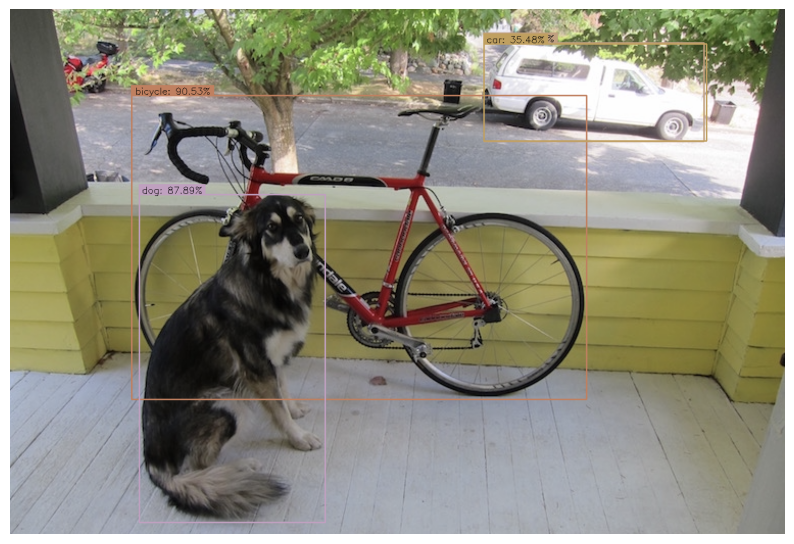

In [16]:
results = od_model(images[0])
results ={key:value.numpy() for key,value in results.items()}

image = np.squeeze(images[0])

img_bbox = process_detection(image, results)

plt.figure(figsize=(10, 10))
plt.imshow(img_bbox)
plt.axis('off')

# Formalize the Implementation

In [19]:
def run_inference(images, model):
  results_list =[]
  for img in images:
    results = model(img)
    results ={key:value.numpy() for key,value in results.items()}
    results_list.append(results)
  return results_list

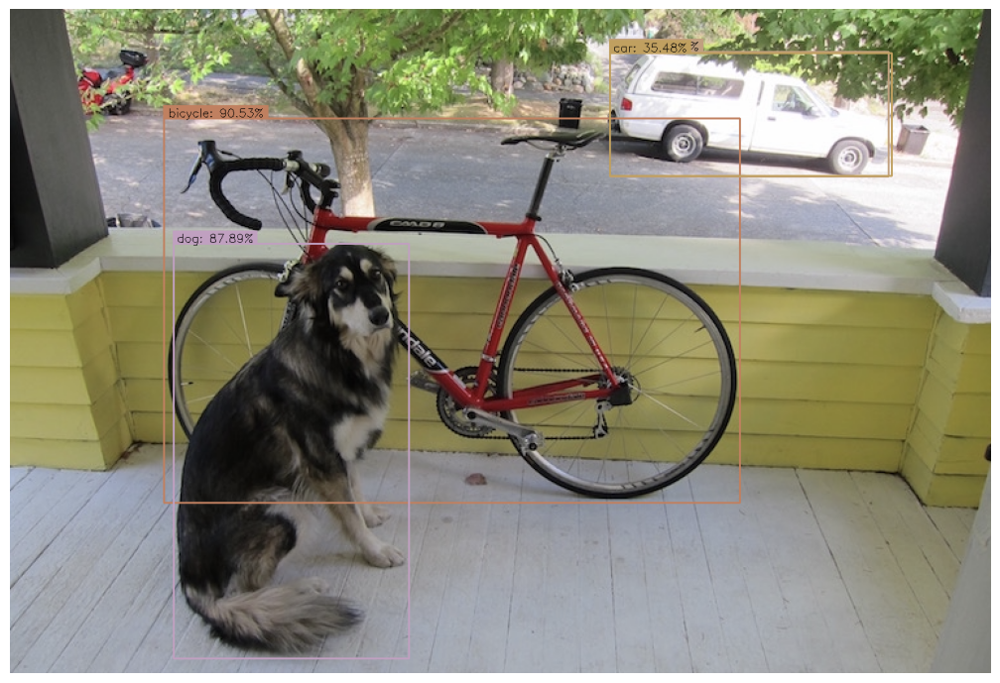

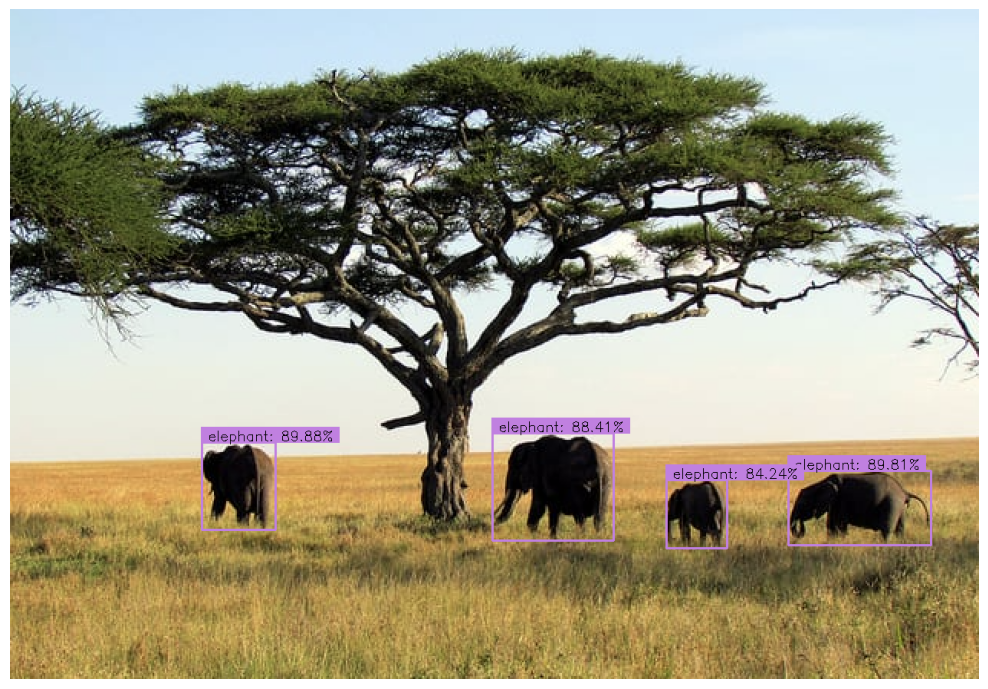

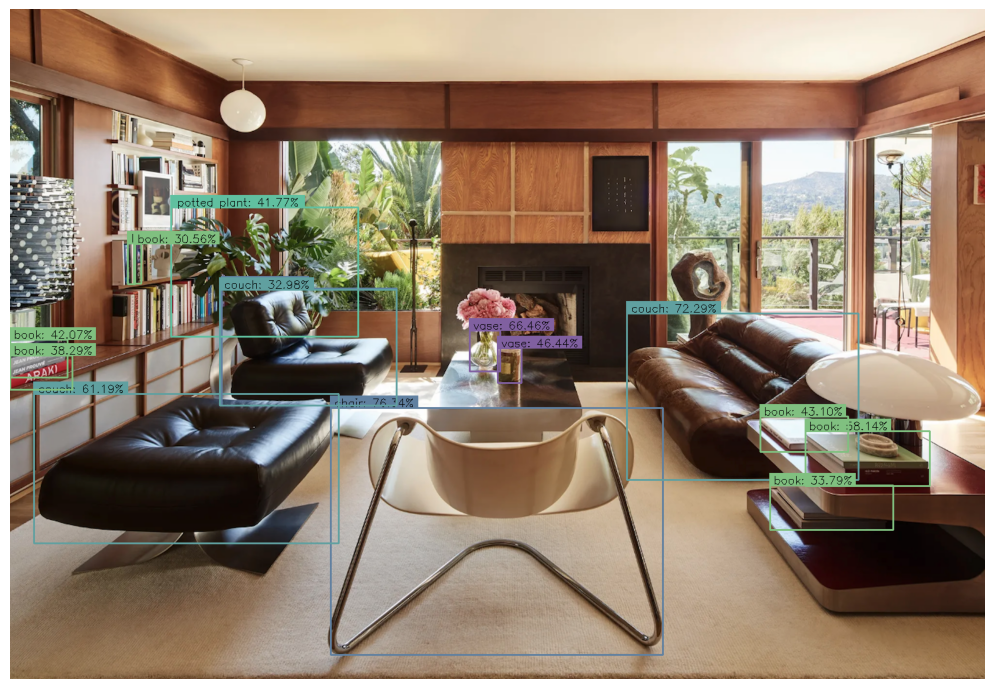

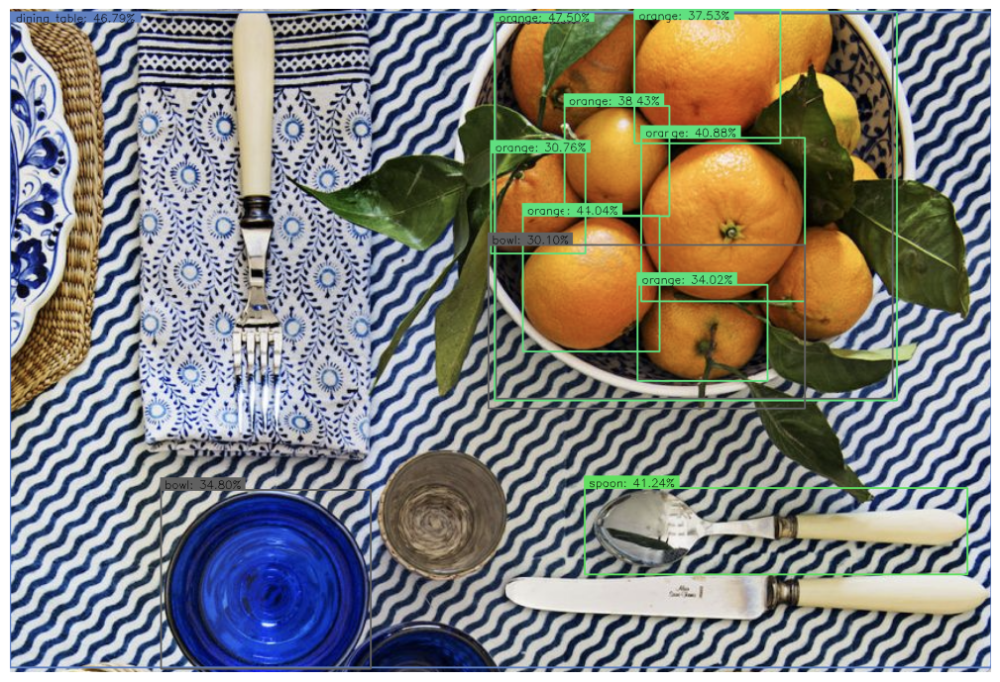

In [20]:
results_list = run_inference(images, od_model)

for idx in range(len(results_list)):
  image = np.squeeze(images[idx])
  img_bbox = process_detection(image, results_list[idx])
  plt.figure(figsize=[20,10*len(images)])
  plt.subplot(len(images),1,idx+1)
  plt.imshow(img_bbox)
  plt.axis('off')
